<a href="https://colab.research.google.com/github/mohithkrishnaa/AI-Stock-Trend-Analyzer/blob/main/Decision_Tress.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
df = pd.read_csv("https://drive.google.com/uc?id=1_rK8orgmy-GnfKAkqh5qHk-6s_pDnGxj")

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [ ]:
df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [ ]:
df.isnull().sum()

,0
ID,0
LIMIT_BAL,0
SEX,0
EDUCATION,0
MARRIAGE,0
AGE,0
PAY_0,0
PAY_2,0
PAY_3,0
PAY_4,0


In [ ]:
df.rename(columns={"PAY_0": "PAY_1"}, inplace=True)

In [ ]:
df.rename(columns={"default.payment.next.month": "Default"}, inplace=True)

In [ ]:
# Calculate the number of male and female clients out of all defaulters
df[["ID","SEX","Default"]].groupby(by=["Default","SEX"]).count()

ID
Default SEX       
0       1     9015
        2    14349
1       1     2873
        2     3763

In [ ]:
df.groupby(['SEX', 'MARRIAGE', 'EDUCATION'])['Default'].sum()


SEX  MARRIAGE  EDUCATION
1    0         1               0
               2               0
               3               2
     1         0               0
               1             390
               2             643
               3             303
               4               2
               5               4
               6               4
     2         0               0
               1             506
               2             746
               3             229
               4               2
               5               2
               6               0
     3         1              10
               2              19
               3              11
               4               0
               5               0
2    0         1               0
               2               1
               3               2
     1         0               0
               1             379
               2            1023
               3             451
               4               1
               5               5
               6               1
     2         0               0
               1             748
               2             873
               3             223
               4               2
               5               7
               6               3
     3         1               3
               2              25
               3              16
               4               0
               5               0
               6               0
Name: Default, dtype: int64

In [ ]:
df['MARRIAGE'] = df['MARRIAGE'].replace(3, 0)


In [ ]:
df['EDUCATION'] = df['EDUCATION'].replace([0, 5, 6], 0)


In [ ]:
df.groupby(['SEX', 'MARRIAGE', 'EDUCATION'])['Default'].sum()

SEX  MARRIAGE  EDUCATION
1    0         0               0
               1              10
               2              19
               3              13
               4               0
     1         0               8
               1             390
               2             643
               3             303
               4               2
     2         0               2
               1             506
               2             746
               3             229
               4               2
2    0         0               0
               1               3
               2              26
               3              18
               4               0
     1         0               6
               1             379
               2            1023
               3             451
               4               1
     2         0              10
               1             748
               2             873
               3             223
               4               2
Name: Default, dtype: int64

In [ ]:
df.groupby('SEX')['Default'].sum()

,Default
SEX,
1,2873
2,3763


In [ ]:
df.groupby('SEX')['Default'].mean()


,Default
SEX,
1,0.241672
2,0.207763


In [ ]:
(df[df['SEX'] == 2].shape[0] / df.shape[0]) * 100

60.373333333333335

In [ ]:
(df[df['SEX'] == 1].shape[0] / df.shape[0]) * 100

39.626666666666665

In [ ]:
df.groupby('Default')['AGE'].mean()

,AGE
Default,
0,35.417266
1,35.725738


In [ ]:
# avg age for defaulters and non defaluters
df.groupby('Default')['AGE'].mean()

,AGE
Default,
0,35.417266
1,35.725738


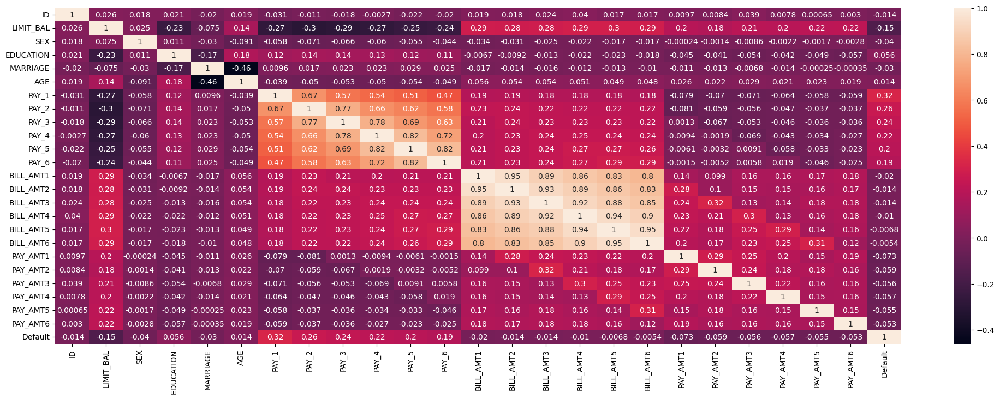

In [ ]:
# correlation matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

corr1 = df.corr()
plt.figure(figsize=(25,8))
sns.heatmap(corr1, annot=True)
plt.show()

In [ ]:
#Building decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
feature_columns = list(df.columns)
feature_columns.remove('Default')
feature_columns.remove('ID')

In [ ]:
x = df[feature_columns]
y = df['Default']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)
model = DecisionTreeClassifier()
model.fit(x_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_pred=model.predict(x_train)
y_pred_test=model.predict(x_test)

In [ ]:
# Accuracy results
print(f"Acc score for train: {metrics.accuracy_score(y_train, y_pred)}")
print(f"Acc score for test: {metrics.accuracy_score(y_test, y_pred_test)}")

Acc score for train: 0.9995238095238095
Acc score for test: 0.7247777777777777


In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus


dot_data = StringIO()

export_graphviz(
    decision_tree=model,
    out_file=dot_data,
    filled=True,
    rounded=True,
    feature_names=x_train.columns,
    class_names=[str(c) for c in model.classes_]
)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.258803 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.258803 to fit



# **Pruning of decision tree**
performed to reduce the size of decision tree

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=30)

for i in range(1,20):
  dtree_clf = DecisionTreeClassifier(max_depth=i, random_state=30)
  dtree_clf.fit(x_train, y_train)

  y_test_pred = dtree_clf.predict(x_test)

  print("test accuracy",metrics.accuracy_score(y_test, y_test_pred),"max_depth",i)

test accuracy 0.823 max depth 1
test accuracy 0.8231111111111111 max depth 2
test accuracy 0.8237777777777778 max depth 3
test accuracy 0.8215555555555556 max depth 4
test accuracy 0.818 max depth 5
test accuracy 0.819 max depth 6
test accuracy 0.8156666666666667 max depth 7
test accuracy 0.8124444444444444 max depth 8
test accuracy 0.8125555555555556 max depth 9
test accuracy 0.8053333333333333 max depth 10
test accuracy 0.803 max depth 11
test accuracy 0.7994444444444444 max depth 12
test accuracy 0.7953333333333333 max depth 13
test accuracy 0.7881111111111111 max depth 14
test accuracy 0.7837777777777778 max depth 15
test accuracy 0.7791111111111111 max depth 16
test accuracy 0.7716666666666666 max depth 17
test accuracy 0.7694444444444445 max depth 18
test accuracy 0.7578888888888888 max depth 19


In [ ]:
#Rebuild the model with  max depth = 3
dtree_clf_new = DecisionTreeClassifier(max_depth=3, random_state=20)
dtree_clf_new.fit(x_train, y_train)

y_test_pred_new = dtree_clf_new.predict(x_test)
y_train_pred_new = dtree_clf_new.predict(x_train)

print("test accuracy",metrics.accuracy_score(y_test, y_test_pred_new))
print("train accuracy",metrics.accuracy_score(y_train, y_train_pred_new))

test accuracy 0.8237777777777778
train accuracy 0.8201904761904761


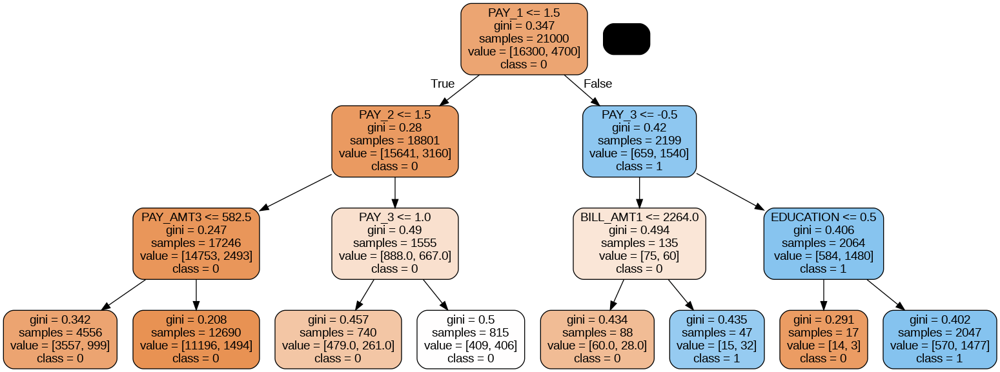

In [ ]:
dot_data = StringIO()
export_graphviz(dtree_clf_new, out_file=dot_data, filled=True, rounded=True, feature_names=x.columns, class_names=["0","1"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("decision_tree.png")
Image(graph.create_png())